**Project 1. Deep Learning: Image Classification with CNN.**

Group 1: Katy, John, Daan

In [17]:
#Importing libaries
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical

In [18]:
# Load CIFAR-10 dataset
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

In [19]:
y_train_cat = to_categorical(y_train, 10)
y_test_cat = to_categorical(y_test, 10)

#Normalizing
x_train_norm = x_train.astype('float32') / 255.0
x_test_norm = x_test.astype('float32') / 255.0

#Augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

datagen.fit(x_train)

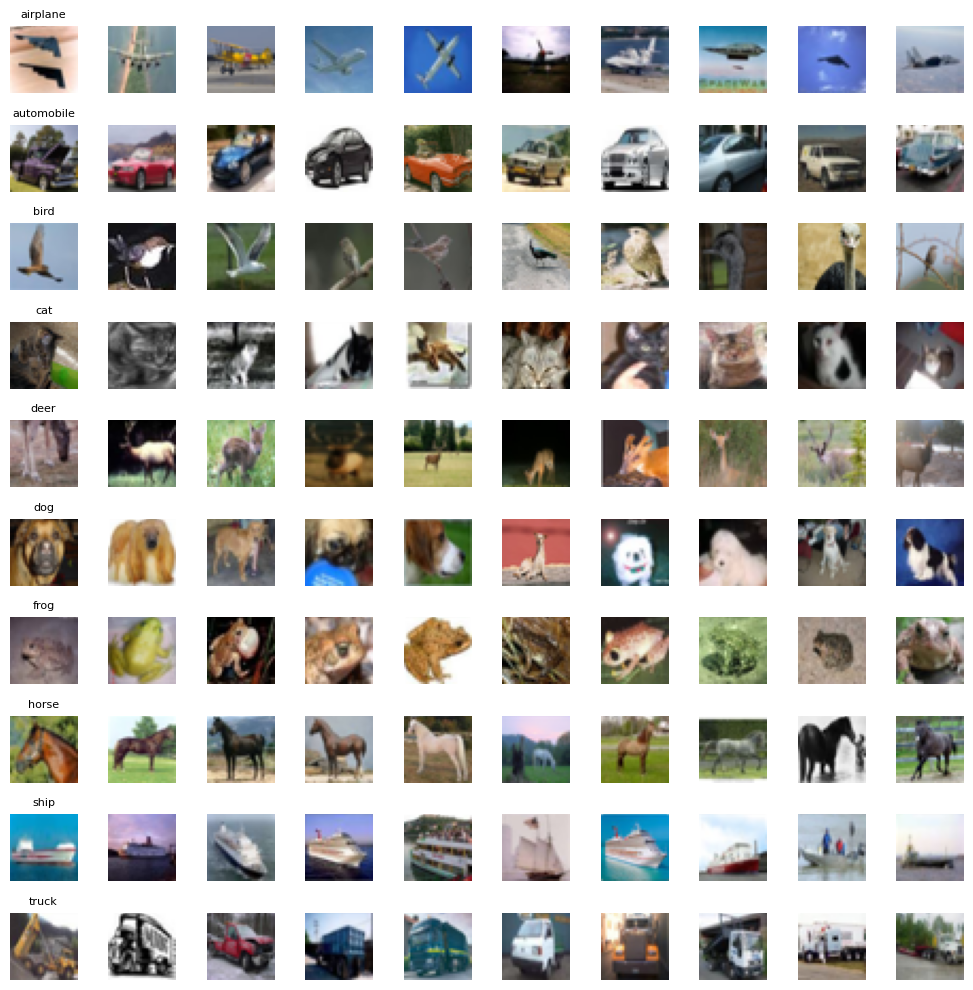

In [20]:
#Visualizing
#Assigning class names/labels
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

#Creating visualization to check.
plt.figure(figsize=(10, 10))

for class_idx in range(10):
    class_images = x_train[y_train.flatten() == class_idx]
    chosen_images = class_images[np.random.choice(len(class_images), 10, replace=False)]

    for i in range(10):
        plt.subplot(10, 10, class_idx * 10 + i + 1)
        plt.imshow(chosen_images[i])
        plt.axis('off')
        if i == 0:
            plt.title(class_names[class_idx], fontsize=8)

plt.tight_layout()
plt.show()

In [34]:
# Here we just wanted to see what it looks like if we want to see more pictues per class.
# plt.figure(figsize=(10, 20))  # Adjust figure size for more rows

# for class_idx in range(10):
#     class_images = x_train[y_train.flatten() == class_idx]
#     chosen_images = class_images[np.random.choice(len(class_images), 20, replace=False)]

#     for i in range(20):
#         plt.subplot(20, 10, class_idx * 20 + i + 1)
#         plt.imshow(chosen_images[i])
#         plt.axis('off')
#         if i == 0:
#             plt.title(class_names[class_idx], fontsize=8)

# plt.tight_layout()
# plt.show()


In [22]:
#Clearing any previous model states
from keras.backend import clear_session
clear_session()

In [ ]:
# Model Architecture Attempt 1, we later decided that this can be commented out since we found a better model.
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# #Model with 32 filters with filter size 3,3
# model = Sequential([
#     Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),   #Convolutional layers
#     MaxPooling2D(pool_size=(2, 2)),   #Pooling layers
#     Flatten(),
#     Dense(100, activation='relu'),
#     Dense(10, activation='softmax')
# ])

# model.compile(optimizer='adam',
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 7200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       720,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 722,006 (2.75 MB)

 Trainable params: 722,006 (2.75 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# #Model training, attempt 1
# # Compiling
# model.compile(
#     loss='categorical_crossentropy',
#     optimizer='SGD',
#     metrics=['accuracy']
# )

# # Training
# history = model.fit(
#     x_train_norm,
#     y_train_cat,
#     epochs=50,
#     batch_size=512,
#     validation_data=(x_test_norm, y_test_cat),
#     verbose=2
# )

Epoch 1/50
98/98 - 6s - 63ms/step - accuracy: 0.1960 - loss: 2.2275 - val_accuracy: 0.2436 - val_loss: 2.1494
Epoch 2/50
98/98 - 6s - 60ms/step - accuracy: 0.2774 - loss: 2.0782 - val_accuracy: 0.3062 - val_loss: 2.0188
Epoch 3/50
98/98 - 1s - 11ms/step - accuracy: 0.3117 - loss: 1.9733 - val_accuracy: 0.3209 - val_loss: 1.9437
Epoch 4/50
98/98 - 1s - 12ms/step - accuracy: 0.3325 - loss: 1.9130 - val_accuracy: 0.3435 - val_loss: 1.8894
Epoch 5/50
98/98 - 1s - 14ms/step - accuracy: 0.3473 - loss: 1.8724 - val_accuracy: 0.3415 - val_loss: 1.8676
Epoch 6/50
98/98 - 1s - 13ms/step - accuracy: 0.3608 - loss: 1.8425 - val_accuracy: 0.3535 - val_loss: 1.8322
Epoch 7/50
98/98 - 1s - 11ms/step - accuracy: 0.3683 - loss: 1.8151 - val_accuracy: 0.3632 - val_loss: 1.8124
Epoch 8/50
98/98 - 1s - 10ms/step - accuracy: 0.3792 - loss: 1.7886 - val_accuracy: 0.3752 - val_loss: 1.7792
Epoch 9/50
98/98 - 1s - 13ms/step - accuracy: 0.3867 - loss: 1.7630 - val_accuracy: 0.3869 - val_loss: 1.7531
Epoch 10/5

In [23]:
#Step 2 Model Archittecture
#Model attempt 2. Adding blocks for more complexity, trying to find better accuracy and less loss.
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow import keras

model_SGD = Sequential()

# Conv Block 1
model_SGD.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(32, 32, 3)))
model_SGD.add(BatchNormalization())
model_SGD.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model_SGD.add(BatchNormalization())
model_SGD.add(MaxPooling2D(pool_size=(2, 2)))
model_SGD.add(Dropout(0.25))

# Conv Block 2
model_SGD.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model_SGD.add(BatchNormalization())
model_SGD.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model_SGD.add(BatchNormalization())
model_SGD.add(MaxPooling2D(pool_size=(2, 2)))
model_SGD.add(Dropout(0.25))

# Fully Connected
model_SGD.add(Flatten())
model_SGD.add(Dense(512, activation='relu'))
model_SGD.add(BatchNormalization())
model_SGD.add(Dropout(0.5))
model_SGD.add(Dense(10, activation='softmax'))  # 10 classes for CIFAR-10

#Step 3 Model training, with optimizer SGD
# Compiling
model_SGD.compile(
    loss='categorical_crossentropy',
    optimizer='SGD', #Stochastic gradient descent
    metrics=['accuracy']
)

# Training
history = model_SGD.fit(
    x_train_norm,
    y_train_cat,
    epochs=50,
    batch_size=512,
    validation_data=(x_test_norm, y_test_cat),
    verbose=2
)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
98/98 - 21s - 216ms/step - accuracy: 0.2670 - loss: 2.5526 - val_accuracy: 0.1000 - val_loss: 2.7918
Epoch 2/50
98/98 - 4s - 40ms/step - accuracy: 0.3700 - loss: 1.9976 - val_accuracy: 0.1022 - val_loss: 3.1204
Epoch 3/50
98/98 - 4s - 40ms/step - accuracy: 0.4163 - loss: 1.7942 - val_accuracy: 0.1467 - val_loss: 2.9246
Epoch 4/50
98/98 - 4s - 40ms/step - accuracy: 0.4492 - loss: 1.6565 - val_accuracy: 0.2562 - val_loss: 2.2533
Epoch 5/50
98/98 - 4s - 41ms/step - accuracy: 0.4659 - loss: 1.5704 - val_accuracy: 0.3965 - val_loss: 1.7349
Epoch 6/50
98/98 - 4s - 41ms/step - accuracy: 0.4926 - loss: 1.4810 - val_accuracy: 0.5053 - val_loss: 1.4002
Epoch 7/50
98/98 - 4s - 41ms/step - accuracy: 0.5063 - loss: 1.4233 - val_accuracy: 0.5221 - val_loss: 1.3627
Epoch 8/50
98/98 - 4s - 41ms/step - accuracy: 0.5247 - loss: 1.3686 - val_accuracy: 0.5427 - val_loss: 1.3406
Epoch 9/50
98/98 - 4s - 41ms/step - accuracy: 0.5380 - loss: 1.3265 - val_accuracy: 0.6003 - val_loss: 1.1314
Epoch 10

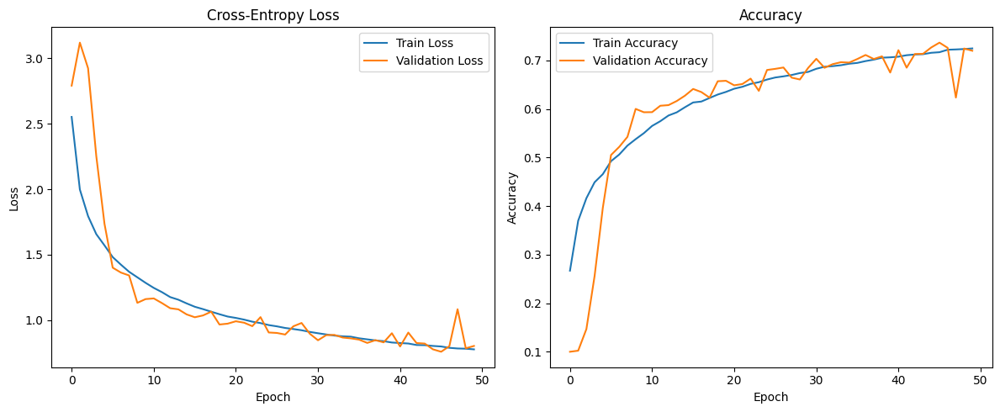

In [24]:
import matplotlib.pyplot as plt
# Visualizing our Accuracy and Loss, for the model with the SGD optimizer
# Plot Cross-Entropy Loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Cross-Entropy Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [25]:
#Saving our model with SGD optimizer.
model_SGD.save('SGD_model.h5')

In [26]:
from tensorflow.keras.models import load_model
model_SGD = load_model('SGD_model.h5')

In [27]:
from keras.backend import clear_session
clear_session()

In [28]:
#trying to make a new model now with a different optimizer, here we are using adam instead of SGD
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

model_adam = Sequential()

# Conv Block 1
model_adam.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(32, 32, 3)))
model_adam.add(BatchNormalization())
model_adam.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model_adam.add(BatchNormalization())
model_adam.add(MaxPooling2D(pool_size=(2, 2)))
model_adam.add(Dropout(0.25))

# Conv Block 2
model_adam.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model_adam.add(BatchNormalization())
model_adam.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model_adam.add(BatchNormalization())
model_adam.add(MaxPooling2D(pool_size=(2, 2)))
model_adam.add(Dropout(0.25))

# Fully Connected
model_adam.add(Flatten())
model_adam.add(Dense(512, activation='relu'))
model_adam.add(BatchNormalization())
model_adam.add(Dropout(0.5))
model_adam.add(Dense(10, activation='softmax'))  # 10 classes for CIFAR-10

#Step 3 Model training, with optimizer adam
# Compiling
model_adam.compile(
    loss='categorical_crossentropy',
    optimizer='adam', #trying with adam now instead of SGD
    metrics=['accuracy']
)

# Stop training if val_accuracy doesn't improve after 5 epochs
early_stop = EarlyStopping(
    monitor='val_accuracy',
    patience=5,
    restore_best_weights=True
)

# Save best model weights to file
checkpoint = ModelCheckpoint(
    'best_cnn_model.h5',
    monitor='val_accuracy',
    save_best_only=True
)

# Training
history = model_adam.fit(
    x_train_norm,
    y_train_cat,
    epochs=50,
    batch_size=512,
    validation_data=(x_test_norm, y_test_cat),
    callbacks=[early_stop, checkpoint],
    verbose=2
)


Epoch 1/50


98/98 - 19s - 194ms/step - accuracy: 0.4510 - loss: 1.7325 - val_accuracy: 0.1137 - val_loss: 3.2448
Epoch 2/50


98/98 - 4s - 44ms/step - accuracy: 0.6051 - loss: 1.1335 - val_accuracy: 0.1473 - val_loss: 3.2595
Epoch 3/50


98/98 - 4s - 44ms/step - accuracy: 0.6666 - loss: 0.9476 - val_accuracy: 0.1640 - val_loss: 3.6184
Epoch 4/50


98/98 - 4s - 44ms/step - accuracy: 0.7054 - loss: 0.8368 - val_accuracy: 0.3075 - val_loss: 2.2956
Epoch 5/50


98/98 - 4s - 44ms/step - accuracy: 0.7315 - loss: 0.7615 - val_accuracy: 0.5319 - val_loss: 1.3728
Epoch 6/50


98/98 - 4s - 44ms/step - accuracy: 0.7533 - loss: 0.7009 - val_accuracy: 0.7358 - val_loss: 0.7573
Epoch 7/50


98/98 - 4s - 44ms/step - accuracy: 0.7713 - loss: 0.6454 - val_accuracy: 0.7421 - val_loss: 0.7437
Epoch 8/50


98/98 - 4s - 44ms/step - accuracy: 0.7862 - loss: 0.6047 - val_accuracy: 0.7464 - val_loss: 0.7385
Epoch 9/50


98/98 - 4s - 44ms/step - accuracy: 0.8000 - loss: 0.5673 - val_accuracy: 0.7595 - val_loss: 0.7013
Epoch 10/50


98/98 - 4s - 44ms/step - accuracy: 0.8122 - loss: 0.5289 - val_accuracy: 0.7717 - val_loss: 0.6800
Epoch 11/50


98/98 - 4s - 44ms/step - accuracy: 0.8266 - loss: 0.4906 - val_accuracy: 0.7815 - val_loss: 0.6339
Epoch 12/50


98/98 - 4s - 44ms/step - accuracy: 0.8368 - loss: 0.4616 - val_accuracy: 0.7896 - val_loss: 0.6339
Epoch 13/50
98/98 - 4s - 43ms/step - accuracy: 0.8462 - loss: 0.4306 - val_accuracy: 0.7647 - val_loss: 0.7441
Epoch 14/50


98/98 - 4s - 44ms/step - accuracy: 0.8575 - loss: 0.4029 - val_accuracy: 0.7937 - val_loss: 0.6275
Epoch 15/50


98/98 - 4s - 44ms/step - accuracy: 0.8634 - loss: 0.3823 - val_accuracy: 0.7968 - val_loss: 0.6412
Epoch 16/50


98/98 - 4s - 43ms/step - accuracy: 0.8723 - loss: 0.3637 - val_accuracy: 0.8036 - val_loss: 0.6074
Epoch 17/50
98/98 - 4s - 42ms/step - accuracy: 0.8808 - loss: 0.3363 - val_accuracy: 0.7996 - val_loss: 0.6140
Epoch 18/50


98/98 - 4s - 43ms/step - accuracy: 0.8873 - loss: 0.3137 - val_accuracy: 0.8062 - val_loss: 0.6191
Epoch 19/50
98/98 - 4s - 42ms/step - accuracy: 0.8945 - loss: 0.2983 - val_accuracy: 0.7983 - val_loss: 0.6580
Epoch 20/50


98/98 - 4s - 44ms/step - accuracy: 0.8970 - loss: 0.2865 - val_accuracy: 0.8076 - val_loss: 0.5995
Epoch 21/50
98/98 - 4s - 42ms/step - accuracy: 0.9056 - loss: 0.2647 - val_accuracy: 0.8072 - val_loss: 0.6434
Epoch 22/50
98/98 - 4s - 42ms/step - accuracy: 0.9068 - loss: 0.2633 - val_accuracy: 0.8062 - val_loss: 0.6285
Epoch 23/50
98/98 - 4s - 43ms/step - accuracy: 0.9124 - loss: 0.2444 - val_accuracy: 0.7973 - val_loss: 0.6666
Epoch 24/50
98/98 - 4s - 42ms/step - accuracy: 0.9157 - loss: 0.2338 - val_accuracy: 0.8063 - val_loss: 0.6447
Epoch 25/50
98/98 - 4s - 43ms/step - accuracy: 0.9209 - loss: 0.2228 - val_accuracy: 0.7982 - val_loss: 0.6833


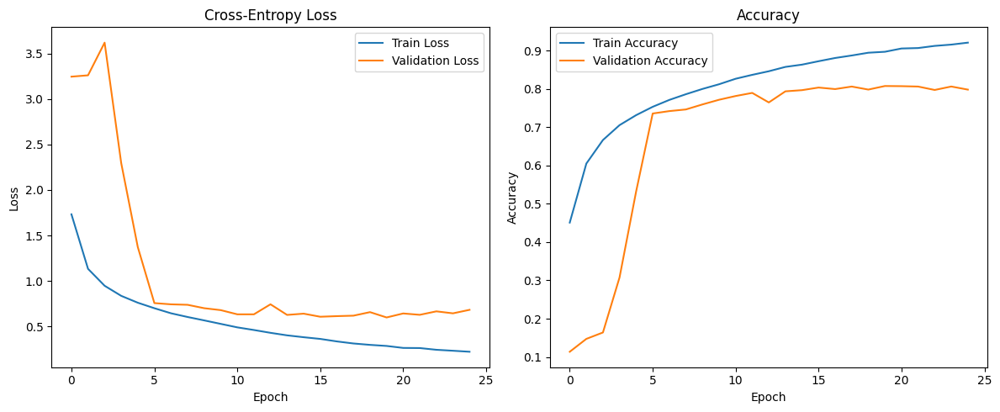

In [29]:
# Visualizing our Accuracy and Loss, for the model with adam optimizer
# Plot Cross-Entropy Loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Cross-Entropy Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [30]:
from tensorflow.keras.models import load_model
model_adam_early = load_model('best_cnn_model.h5')

In [14]:
# Step 4 Model evaluation

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


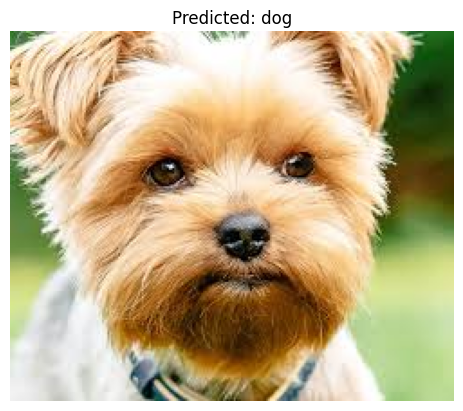

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


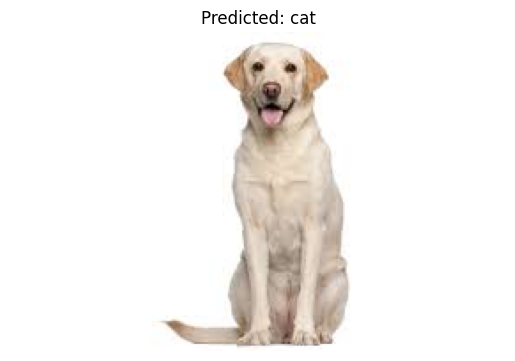

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


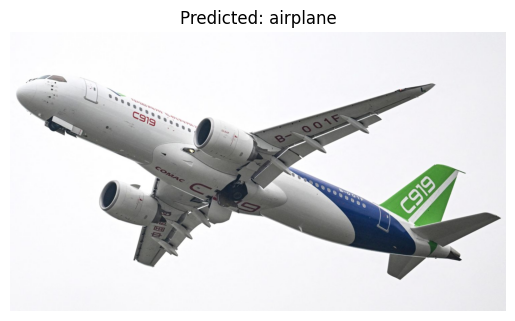

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


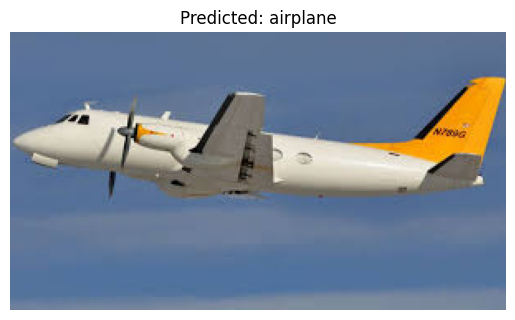

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


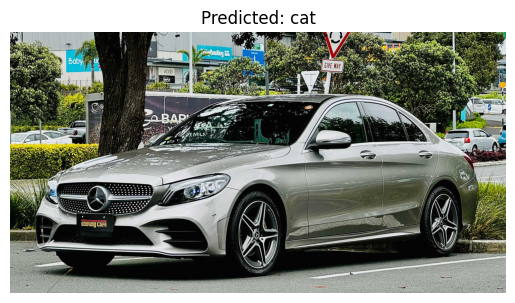

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


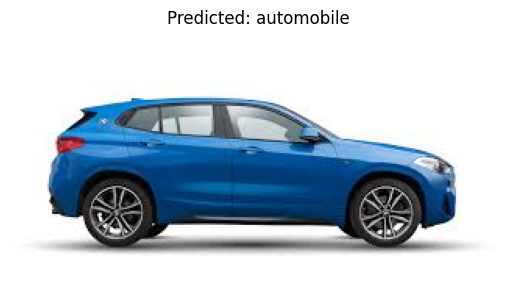

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


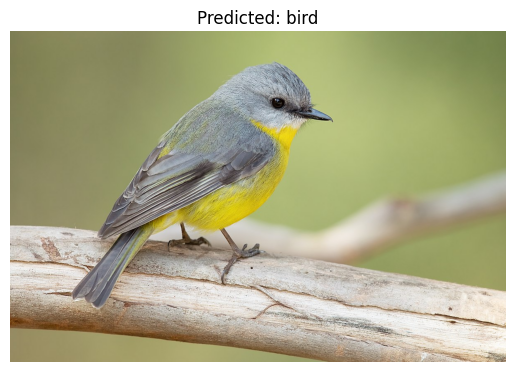

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


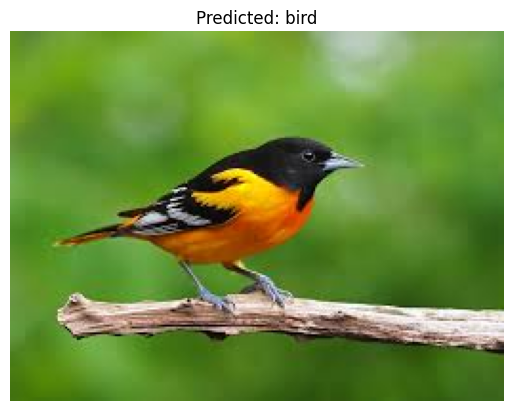

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


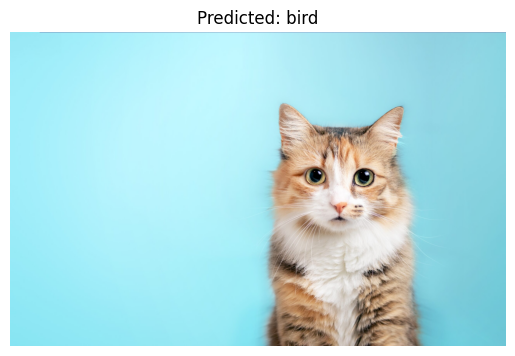

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


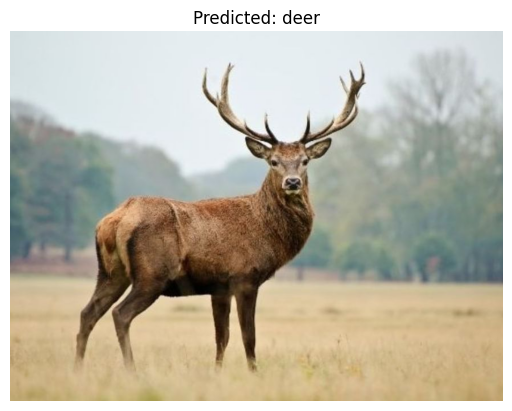

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


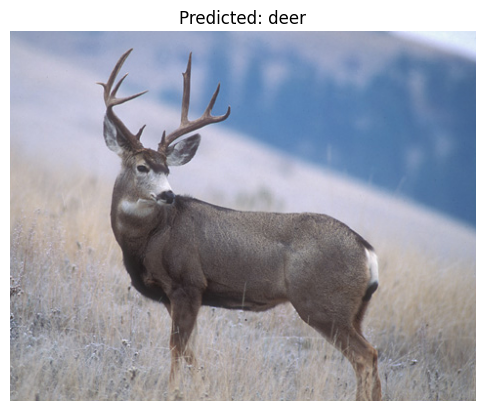

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


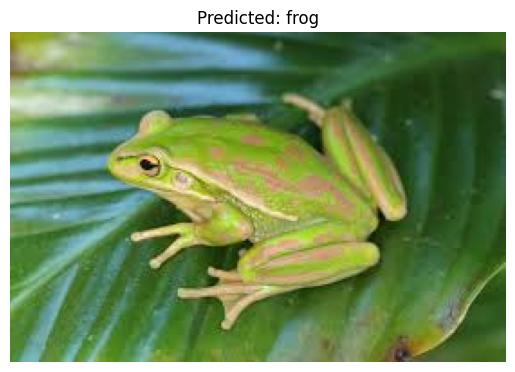

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


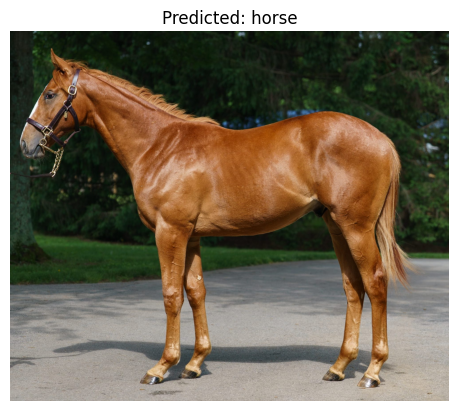

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


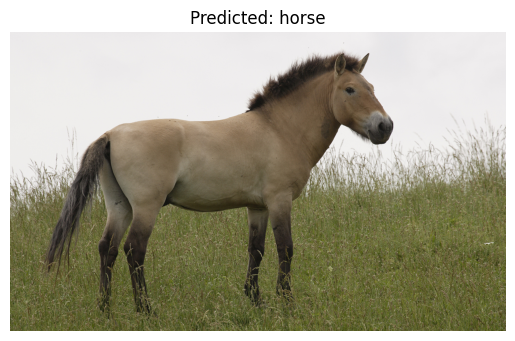

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


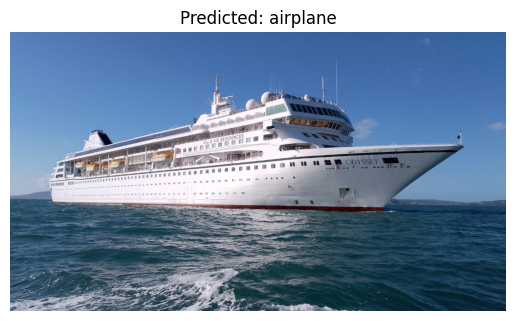

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


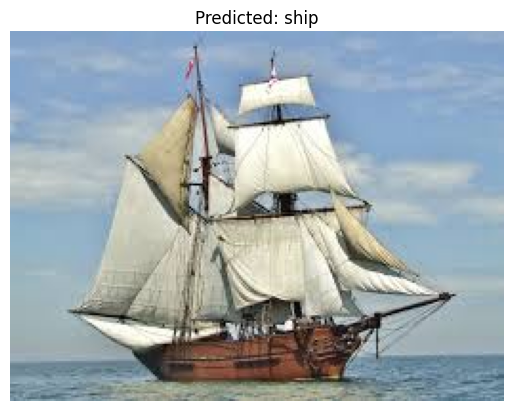

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


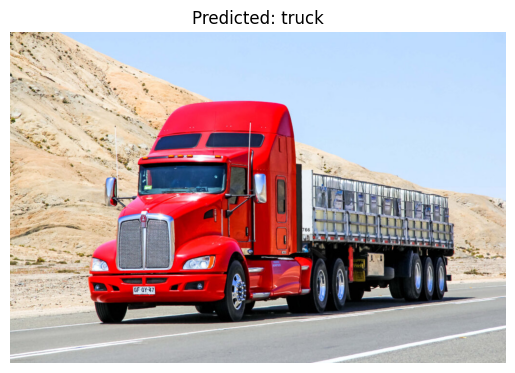

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


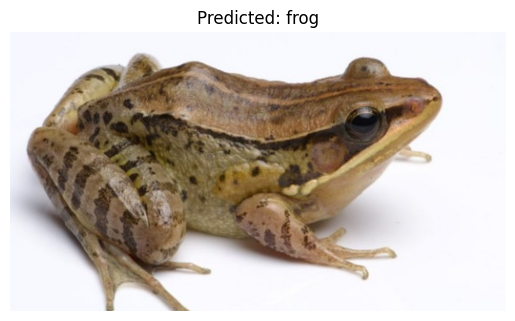

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


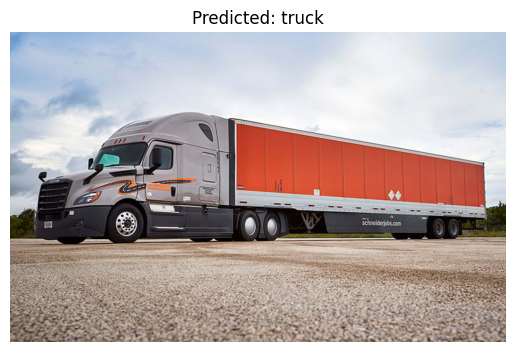

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


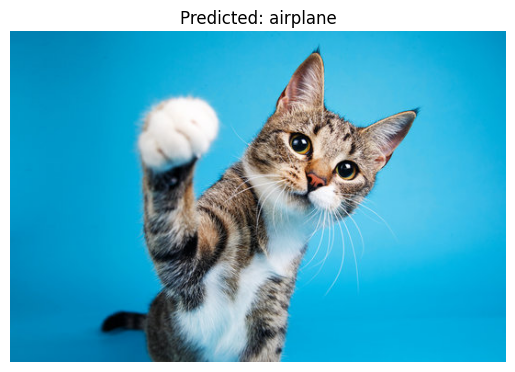

In [ ]:
# Evaluate the trained model on a separate validation set. Done on the saved epoch in our model using the adam optimizer
import os
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# uploading a folder of 20 pictures, has 2 pictures of each class.
folder_path = '/content/drive/MyDrive/project_1_random_images/Images_project_1'

class_labels = ['airplane', 'automobile', 'bird', 'cat', 'deer',
                'dog', 'frog', 'horse', 'ship', 'truck']  # CIFAR-10 labels

for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.jpg', '.png')):
        img_path = os.path.join(folder_path, filename)
        img = image.load_img(img_path, target_size=(32, 32))
        img_array = image.img_to_array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        prediction = model_adam_early.predict(img_array)
        predicted_class = np.argmax(prediction)

        plt.imshow(Image.open(img_path))
        plt.title(f'Predicted: {class_labels[predicted_class]}')
        plt.axis('off')
        plt.show()




In [31]:
# Step 4 Model evaluation, part 2
# Compute and report metrics such as accuracy, precision, recall, and F1-score. (for our model using the adam optimizer)
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Predict on test set
y_pred_probs = model_adam_early.predict(x_test_norm)
y_pred = np.argmax(y_pred_probs, axis=1)

# Convert one-hot labels back to class indices
y_true = np.argmax(y_test_cat, axis=1)

# Compute metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print("Scores from the adam model")
print(f"Accuracy:  {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

print("----------------------------------")
# now for our model using the SGD optimizer
# Predict on test set
y_pred_probs = model_SGD.predict(x_test_norm)
y_pred = np.argmax(y_pred_probs, axis=1)

# Convert one-hot labels back to class indices
y_true = np.argmax(y_test_cat, axis=1)

# Compute metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print("Scores from the SGD model")
print(f"Accuracy:  {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")


313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
Scores from the adam model
Accuracy:  0.8076
Precision: 0.8100
Recall:    0.8076
F1-score:  0.8076
----------------------------------
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Scores from the SGD model
Accuracy:  0.7201
Precision: 0.7346
Recall:    0.7201
F1-score:  0.7174


313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


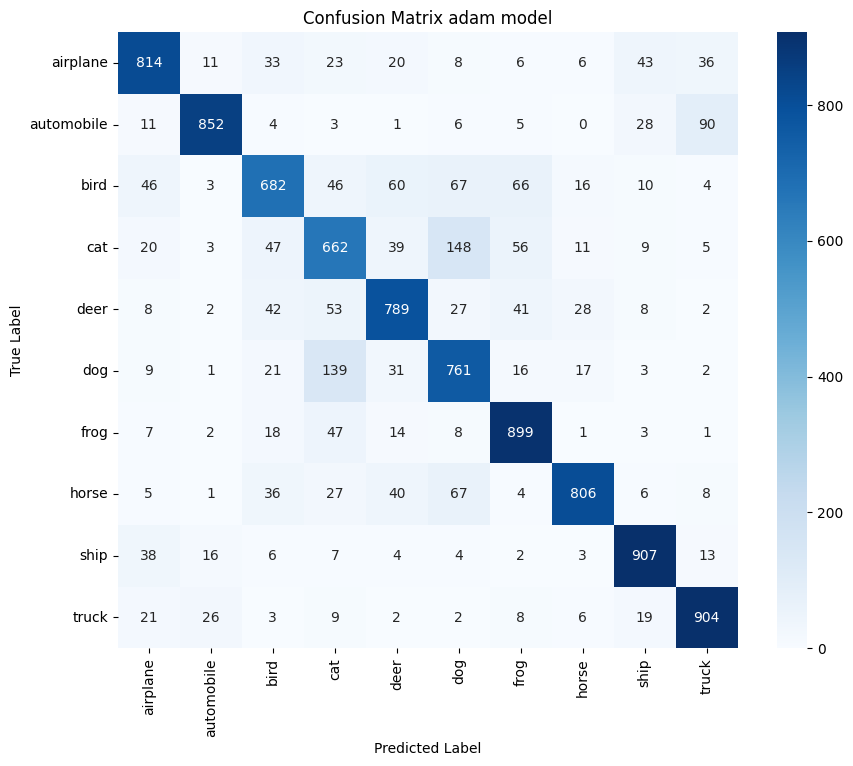

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


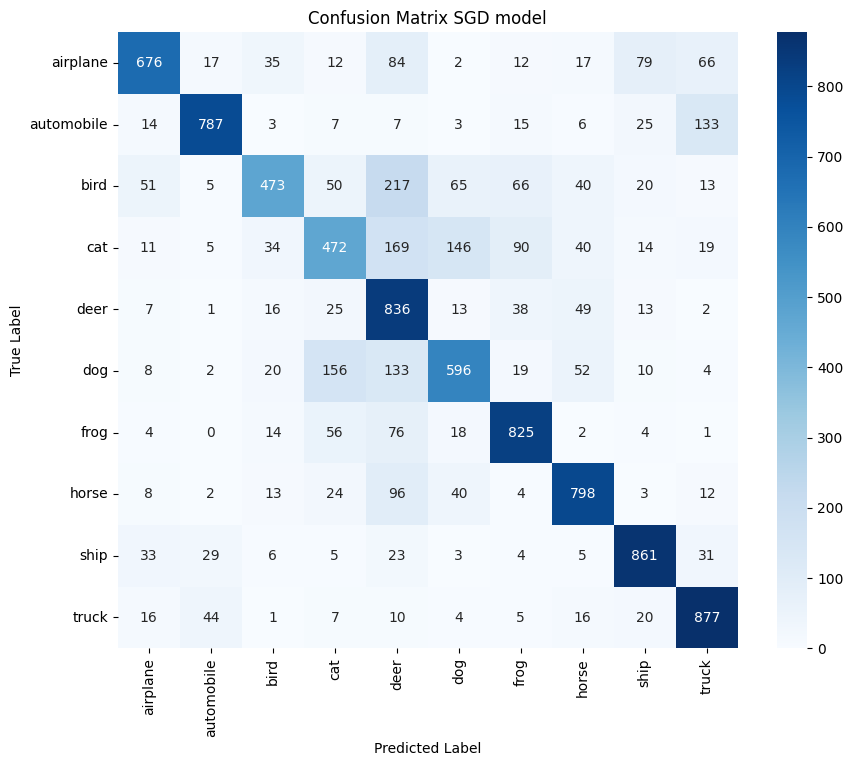

In [32]:
# Step 4 Model evaluation, part 3
# Visualize the confusion matrix to understand model performance across different classes.

# For our model with adam optimizer
y_pred_probs = model_adam_early.predict(x_test_norm)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test_cat, axis=1)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_true, y_pred)

import matplotlib.pyplot as plt
import seaborn as sns

class_labels = ['airplane', 'automobile', 'bird', 'cat', 'deer',
                'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix adam model')
plt.show()

# For SGD model.
y_pred_probs = model_SGD.predict(x_test_norm)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test_cat, axis=1)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_true, y_pred)

import matplotlib.pyplot as plt
import seaborn as sns

class_labels = ['airplane', 'automobile', 'bird', 'cat', 'deer',
                'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix SGD model')
plt.show()


In [33]:
from keras.backend import clear_session
clear_session()

In [10]:
#Step 5 Transfer learning
# Evaluate the accuracy of your model on a pre-trained models like ImagNet, VGG16, Inception... We have choosen the VGG16 model for the transfer learning.
# Perform transfer learning with your chosen pre-trained models
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Input
from tensorflow.keras.applications.vgg16 import preprocess_input
import tensorflow as tf
import numpy as np
import cv2

# Resize CIFAR-10 images to 224x224 for VGG16
x_train_resized = np.array([cv2.resize(img, (224, 224)) for img in x_train])
x_test_resized = np.array([cv2.resize(img, (224, 224)) for img in x_test])
x_test_preprocessed = preprocess_input(x_test_resized)

# Define VGG16-based model
base_model = VGG16(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dense(10, activation='softmax')(x)

vgg_model = Model(inputs=base_model.input, outputs=x)

# Freeze VGG16 base
for layer in base_model.layers:
    layer.trainable = False

# Compile model
vgg_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train on CIFAR-10 if not trained
vgg_model.fit(x_train_resized, y_train_cat, batch_size=32, epochs=10, validation_split=0.2)

# Evaluate
vgg_loss, vgg_accuracy = vgg_model.evaluate(x_test_preprocessed, y_test_cat)
print(f"Accuracy of VGG16 model: {vgg_accuracy * 100:.2f}%")

Epoch 1/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 253s 201ms/step - accuracy: 0.6417 - loss: 4.0911 - val_accuracy: 0.7983 - val_loss: 0.6098
Epoch 2/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 253s 203ms/step - accuracy: 0.8662 - loss: 0.3978 - val_accuracy: 0.8245 - val_loss: 0.5740
Epoch 3/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 253s 202ms/step - accuracy: 0.9185 - loss: 0.2442 - val_accuracy: 0.8167 - val_loss: 0.6693
Epoch 4/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 253s 203ms/step - accuracy: 0.9401 - loss: 0.1849 - val_accuracy: 0.8209 - val_loss: 0.7589
Epoch 5/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 253s 202ms/step - accuracy: 0.9508 - loss: 0.1562 - val_accuracy: 0.8226 - val_loss: 0.7429
Epoch 6/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 253s 202ms/step - accuracy: 0.9559 - loss: 0.1364 - val_accuracy: 0.8181 - val_loss: 0.9383
Epoch 7/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 253s 202ms/step - accuracy: 0.9621 - loss: 0.1214 - val_accuracy: 0.8148 - val_loss: 1.0122
Epoch 8/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 253s 202ms/step - ac

In [11]:
#Saving our VGG model, this is the 2nd version. we also have a version with 5 epochs saved.
vgg_model.save('VGG_model_V2.h5')

In [8]:
from tensorflow.keras.models import load_model
VGG_model = load_model('VGG_model.h5')

In [12]:
from tensorflow.keras.models import load_model
VGG_model_V2 = load_model('VGG_model_V2.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


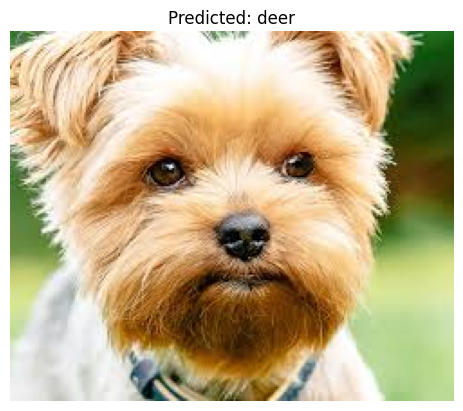

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


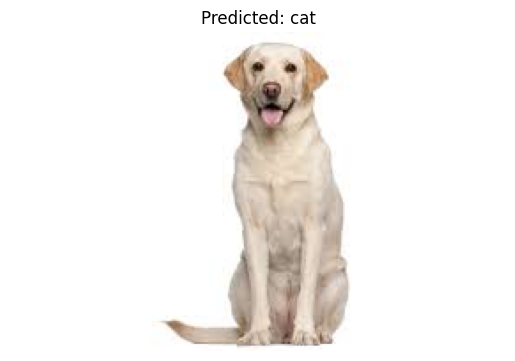

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


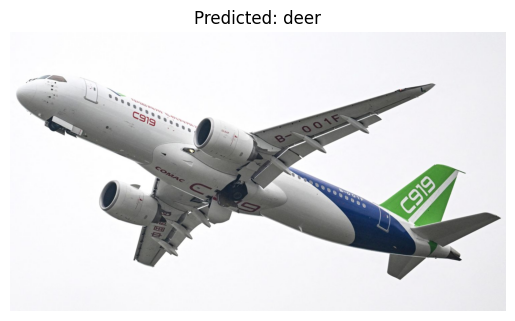

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


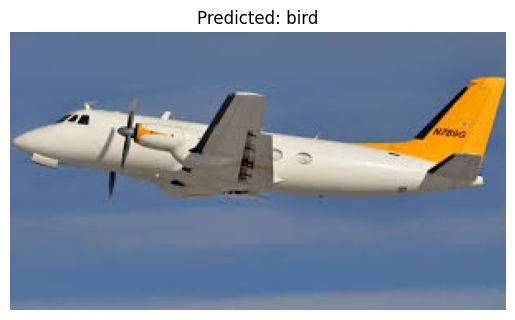

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


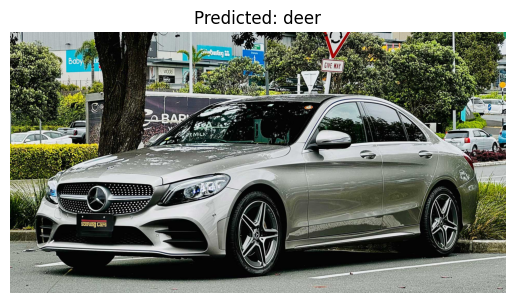

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


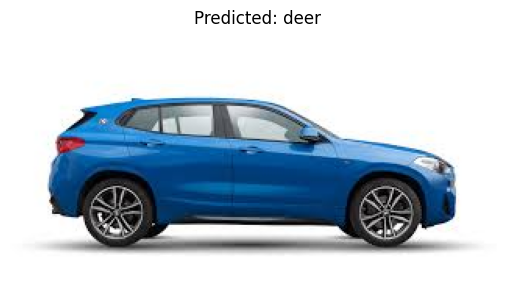

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


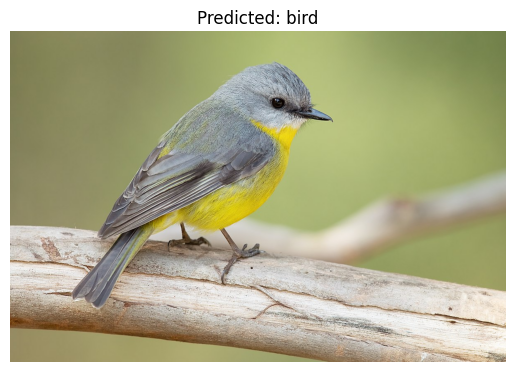

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


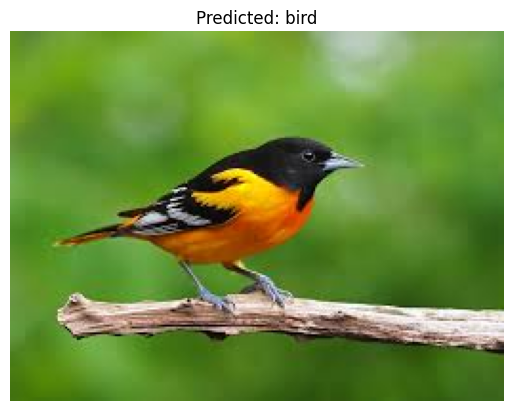

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


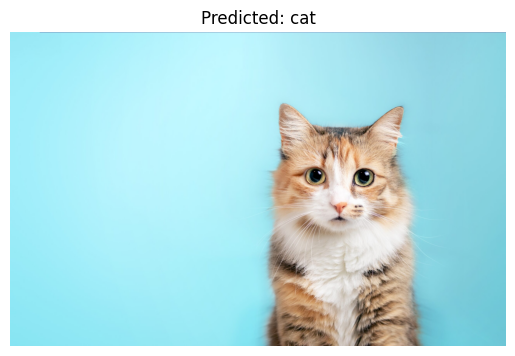

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


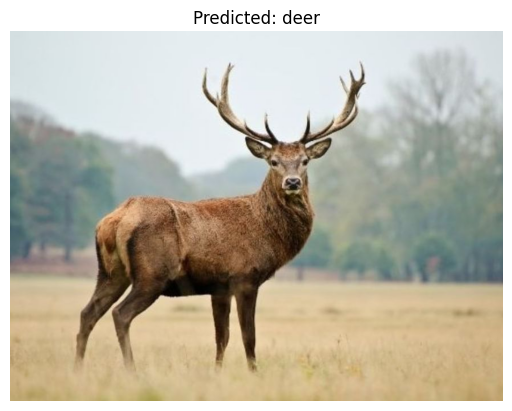

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


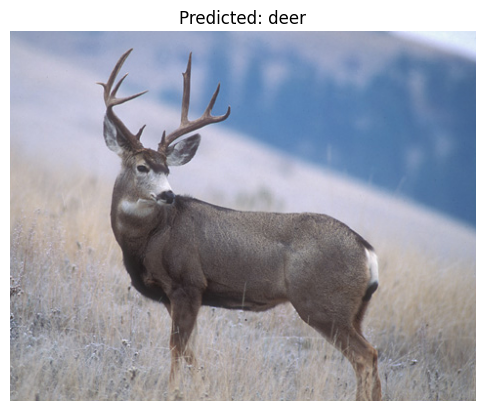

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


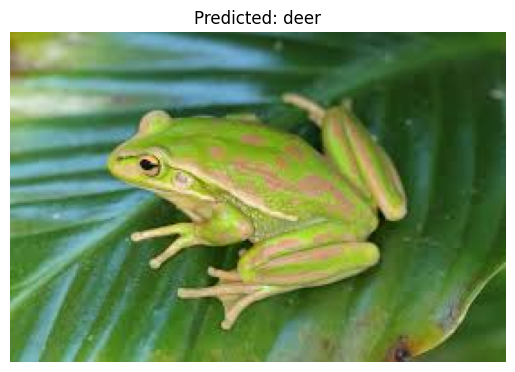

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


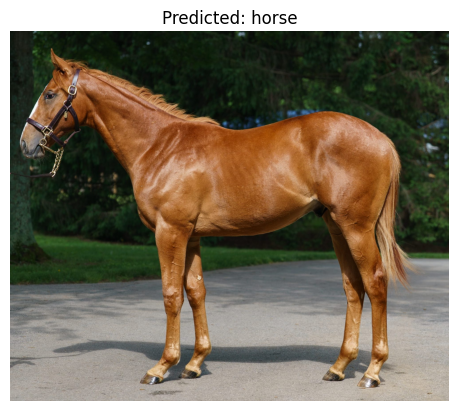

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


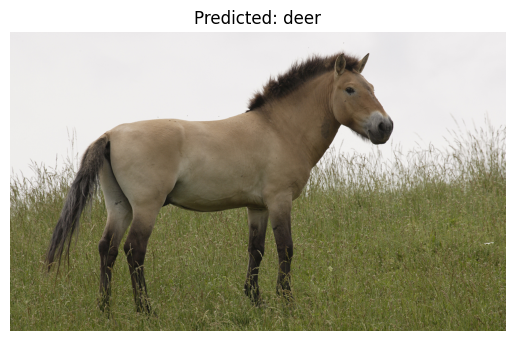

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


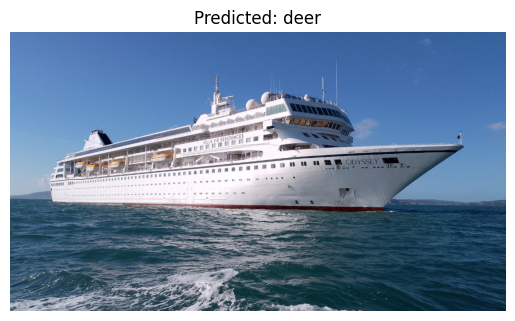

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


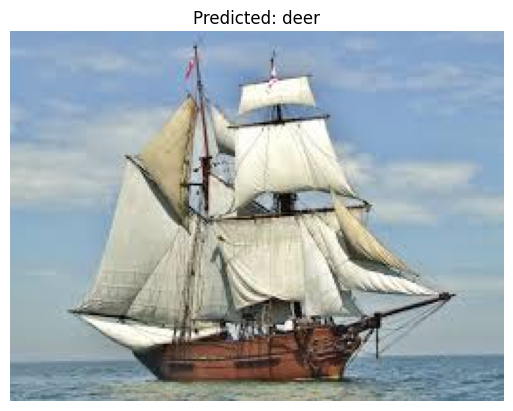

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


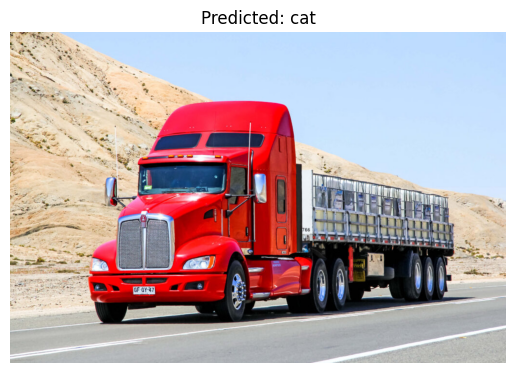

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


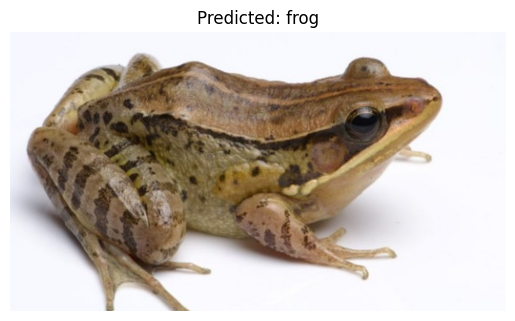

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


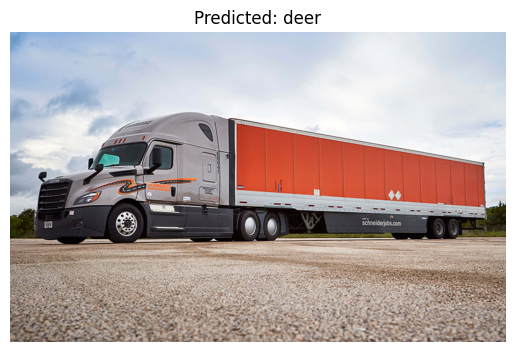

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


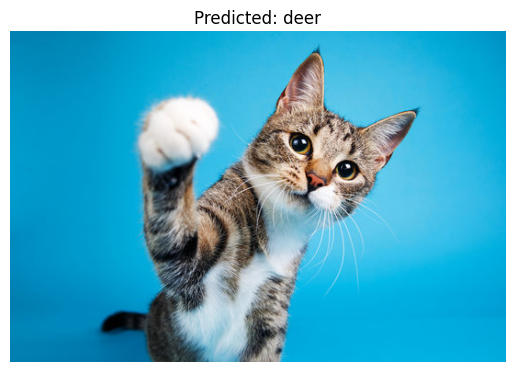

In [16]:
# checking how the VGG model does on our random images
import os
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# uploading a folder of 20 pictures, has 2 of each class.
folder_path = '/content/drive/MyDrive/project_1_random_images/Images_project_1'

class_labels = ['airplane', 'automobile', 'bird', 'cat', 'deer',
                'dog', 'frog', 'horse', 'ship', 'truck']  # CIFAR-10 labels

for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.jpg', '.png')):
        img_path = os.path.join(folder_path, filename)
        img = image.load_img(img_path, target_size=(224, 224, 3))
        img_array = image.img_to_array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        prediction = VGG_model_V2.predict(img_array)
        predicted_class = np.argmax(prediction)

        plt.imshow(Image.open(img_path))
        plt.title(f'Predicted: {class_labels[predicted_class]}')
        plt.axis('off')
        plt.show()

In [ ]:
#Model deployment.
#See the file app.py in the repo to see how the app was build to use the model to make predictions on new images. Or use the link below to test the app on hugging face spaces:
#https://huggingface.co/spaces/DaanBooy/Image_Predictor